In [1]:
import sys
import os
import importlib
import gc
import glob
import random
from itertools import combinations

import numpy as np
import scipy
import sklearn
from sklearn import metrics

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import ticker
import seaborn as sns

import pyemma
import msmtools
import mdtraj as md

import ivac
import extq

In [2]:
sys.path.insert(1, "../../python")
sys.path.insert(1, "../../..")
import util
import plotting

In [3]:
plt.style.use("custom")  # custom style sheet
plt.style.use("muted")  # muted color theme from SciencePlots
cm_seq = sns.cubehelix_palette(
    start=0, rot=-0.70, gamma=0.40, light=0.9, dark=0.1, as_cmap=True, reverse=True
)
cm_seq2 = sns.cubehelix_palette(
    start=0, rot=-0.70, gamma=0.40, light=0.8, dark=0.1, as_cmap=True, reverse=False
)
colors = mpl.colors.to_rgba_array(
    [
        "#364B9A",
        "#4A7BB7",
        "#6EA6CD",
        "#98CAE1",
        "#C2E4EF",
        "#EAECCC",
        "#FEDA8B",
        "#FDB366",
        "#F67E4B",
        "#DD3D2D",
        "#A50026",
    ]
)
cm_div = mpl.colors.LinearSegmentedColormap.from_list("", colors)

# Load data

In [4]:
cv_trajs = list(
    np.load("../../data/raw_feat/cv_dist_spin_anton.npy", allow_pickle=True)
)
cv_trajs.extend(np.load("../../data/raw_feat/cv_dist_spin_anton2.npy")[:115])

In [5]:
sb_labels = []
for r in ("R217", "R223", "R226", "R229", "R232"):
    for n in ("D129", "D136", "D151", "D164", "E183", "D186"):
        sb_labels.append(f"{r} - {n}")

In [6]:
sb_trajs = list(np.load("../../data/raw_feat/feat2_raw_anton.npy", allow_pickle=True))
sb_trajs.extend(np.load("../../data/raw_feat/feat2_raw_anton2.npy")[:115])

In [7]:
cv_arr = np.concatenate(cv_trajs)
sb_arr = np.concatenate(sb_trajs)

traj_inds = util.split_indices(cv_trajs)
print(cv_arr.shape, sb_arr.shape)

(4150115, 2) (4150115, 60)


In [8]:
rf161 = list(np.load("../../data/raw_feat/rf161.npy", allow_pickle=True))
rf161.extend(np.load("../../data/raw_feat/rf161_anton2.npy")[:115])
rf161_arr = np.concatenate(rf161)
print(rf161_arr.shape)

(4150115, 3)


In [9]:
hb_trajs = list(np.load("../../data/raw_feat/hbonds.npy", allow_pickle=True))
hb_trajs.extend(np.load("../../data/raw_feat/hbonds_anton2.npy", allow_pickle=True))
hb_arr = np.concatenate(hb_trajs)
print(hb_arr.shape)

(4150115, 18)


In [10]:
sb_models = np.load("../../data/models_centroids_feat2.npy")

In [11]:
sb_ids = [42, 48, 47, 53]

In [12]:
# load committors
qp_du = np.load("../../data/feat2_dist_du_anton2/qp_downup_3.npy", allow_pickle=True)[8]
# qm_du = np.load("../../data/feat2_dist_du_anton2/qm_downup_3.npy", allow_pickle=True)
# qp_ud = np.load("../../data/feat2_dist_du_anton2/qp_updown_3.npy", allow_pickle=True)
# qm_ud = np.load("../../data/feat2_dist_du_anton2/qm_updown_3.npy", allow_pickle=True)
weights = np.load("../../data/feat2_dist_du_anton2/weights_3_feat5ivac.npy", allow_pickle=True)

In [13]:
j_du_q = np.load("../../data/feat2_dist_du_anton2/j_du_q_3.npy", allow_pickle=True)
j_ud_q = np.load("../../data/feat2_dist_du_anton2/j_ud_q_3.npy", allow_pickle=True)

# Binned flux

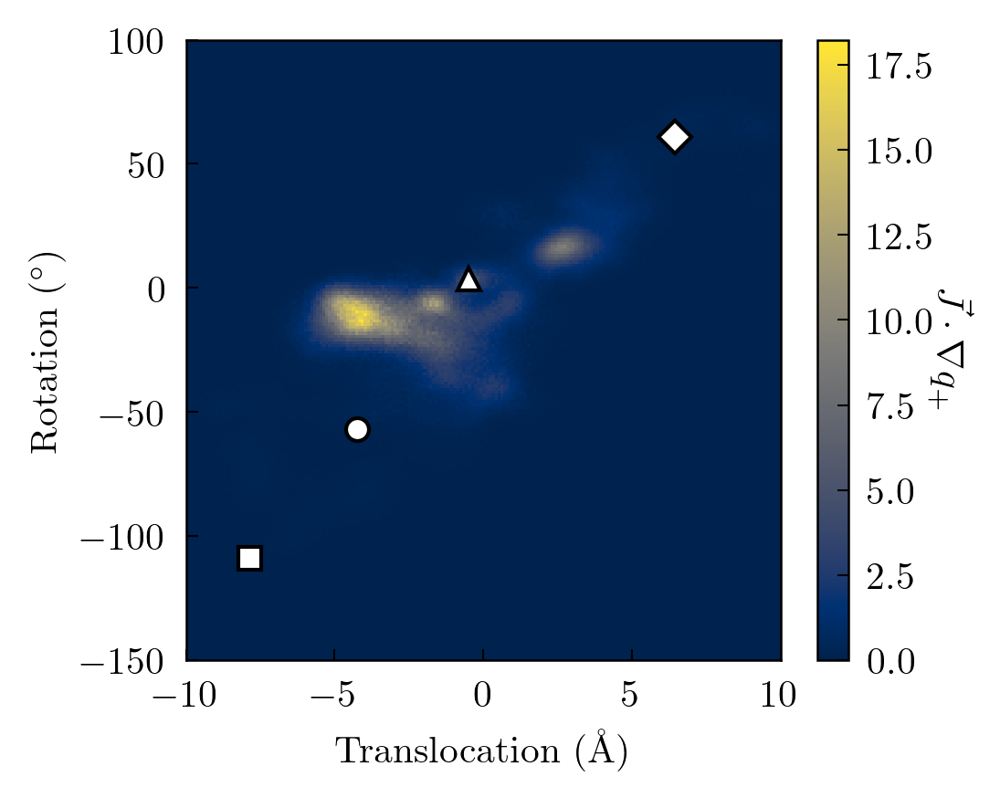

In [15]:
# xe, ye = np.linspace(-10, 10, 201), np.linspace(-150, 100, 201)
xmin, xmax, ymin, ymax = -10, 10, -150, 100
dist_trajs = [t[:, 0] for t in cv_trajs]
rot_trajs = [t[:, 1] for t in cv_trajs]
flux_arr = np.concatenate(j_du_q[4]).clip(min=0)
nx, ny = 200, 200
xstd, ystd = (xmax - xmin) / 1000, (ymax - ymin) / 1000
hist, xe, ye = util.kdesum2d(
    cv_arr[:, 0], cv_arr[:, 1], flux_arr, xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax, nx=200, ny=200, xstd=xstd, ystd=ystd)
# hist = extq.projection.average2d(dist_trajs, rot_trajs, j_du_q[4], weights[0], xe, ye)

f = plt.figure(figsize=(3.5, 3), dpi=300)
ax = f.gca()
pc = ax.pcolor(xe, ye, hist.T / 1e-7, cmap='cividis')
cb = plt.colorbar(pc, ax=ax)
cb.set_label("$\\vec{J} \cdot \\nabla q_+$", rotation=-90, labelpad=10)
plotting.format_cvs(ax, ms=6)

[(3.0, 15.0),
 (7.0, 22.0),
 Text(0.5, 0, 'R226 - D129 distance / Å'),
 Text(0, 0.5, 'R229 - D129 distance / Å')]

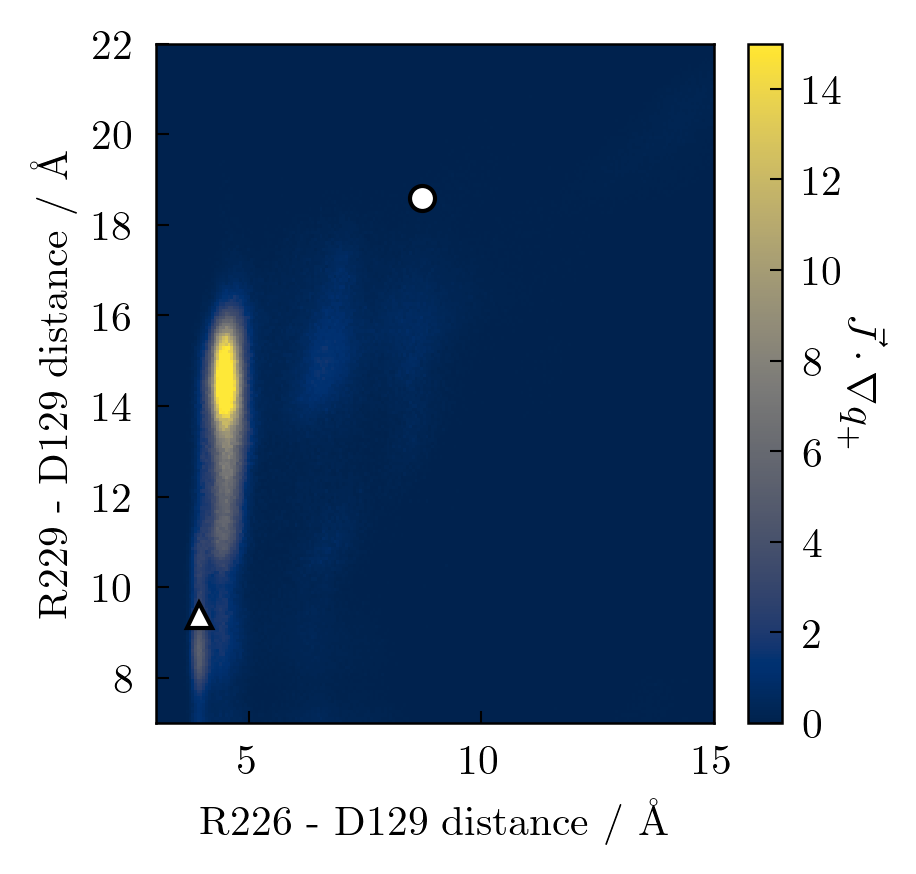

In [18]:
# xe, ye = np.linspace(-10, 10, 201), np.linspace(-150, 100, 201)
xmin, xmax, ymin, ymax = 3, 15, 7, 22
flux_arr = np.concatenate(j_du_q[4]).clip(min=0)

sb0, sb1 = sb_ids[0], sb_ids[1]
xstd, ystd = (xmax - xmin) / 500, (ymax - ymin) / 500
hist, xe, ye = util.kdesum2d(
    sb_arr[:, sb0] * 10, sb_arr[:, sb1] * 10, flux_arr, xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax, nx=200, ny=200, xstd=xstd, ystd=ystd)
# hist = extq.projection.average2d(dist_trajs, rot_trajs, j_du_q[4], weights[0], xe, ye)

f = plt.figure(figsize=(3, 3), dpi=300)
ax = f.gca()
pc = ax.pcolor(xe, ye, hist.T / 1e-7, cmap='cividis', vmax=15)
cb = plt.colorbar(pc, ax=ax)
cb.set_label("$\\vec{J} \cdot \\nabla q_+$", rotation=-90, labelpad=10)
plotting.plot_models(ax, sb_models[:, [sb0, sb1]] * 10, ms=6)
ax.set(
    xlim=[xmin, xmax], 
    ylim=[ymin, ymax], 
    xlabel=f"{util.sb_label(sb0)} distance / Å",
    ylabel=f"{util.sb_label(sb1)} distance / Å"
)

# Committor slices

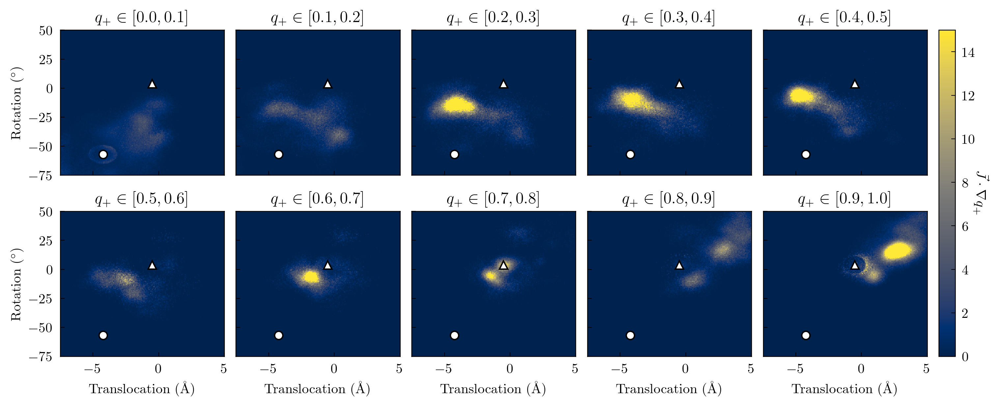

In [21]:
f, axs = plt.subplots(2, 5, figsize=(10, 4), dpi=300, sharex=True, sharey=True, constrained_layout=True)

xmin, xmax, ymin, ymax = -7.5, 5, -100, 50
nx, ny = 200, 200
xstd, ystd = (xmax - xmin) / 500, (ymax - ymin) / 500
flux_arr = np.concatenate(j_du_q[0]).clip(min=0)
q = np.concatenate(qp_du)
for i, ax in enumerate(axs.flat):
    low_lim = i * 0.1
    hi_lim = (i + 1) * 0.1
    q_ts_inds = ((q >= low_lim) & (q <= hi_lim)).nonzero()[0]
    jq_ts = flux_arr[q_ts_inds]
    cv_ts = cv_arr[q_ts_inds]
    # print(q_ts_inds.shape, jq_ts.shape)
    
    flux_hist, xe, ye = util.kdesum2d(
        cv_ts[:, 0], cv_ts[:, 1], jq_ts, xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax, nx=200, ny=200, xstd=xstd, ystd=ystd)
    pc = ax.pcolor(xe, ye, flux_hist.T / 1e-8, cmap='cividis', vmax=15)
    plotting.format_cvs(ax, ms=6)
    ax.set(xlim=[-7.5, 5], ylim=[-75, 50])
    ax.set_title(f"$q_+ \\in [{low_lim:0.1f}, {hi_lim:0.1f}]$")
    ax.label_outer()
    
cb = plt.colorbar(pc, ax=axs[:, -1])
cb.set_label("$\\vec{J} \cdot \\nabla q_+$", rotation=-90, labelpad=10)

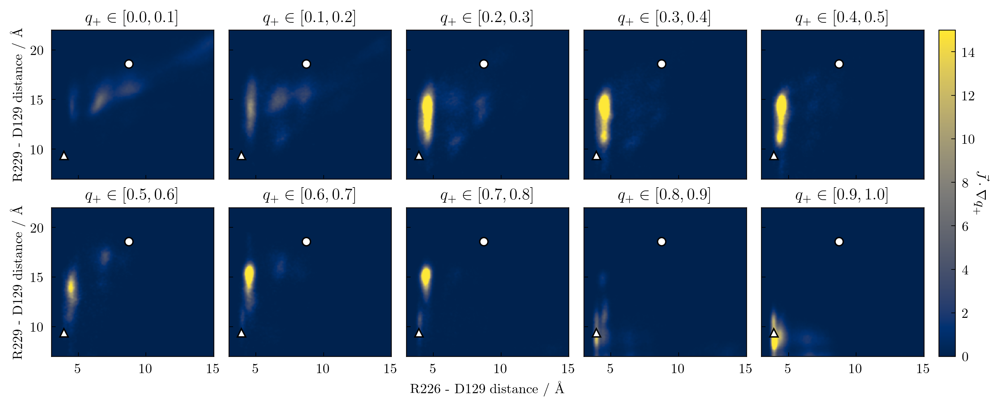

In [23]:
f, axs = plt.subplots(2, 5, figsize=(10, 4), dpi=300, sharex=True, sharey=True, constrained_layout=True)

xmin, xmax, ymin, ymax = 3, 15, 7, 22
sb0, sb1 = sb_ids[0], sb_ids[1]
flux_arr = np.concatenate(j_du_q[4]).clip(min=0)
q = np.concatenate(qp_du)
for i, ax in enumerate(axs.flat):
    low_lim = i * 0.1
    hi_lim = (i + 1) * 0.1
    q_ts_inds = ((q >= low_lim) & (q <= hi_lim)).nonzero()[0]
    jq_ts = flux_arr[q_ts_inds]
    sb_ts = sb_arr[q_ts_inds] * 10
    # print(q_ts_inds.shape, jq_ts.shape)
    
    flux_hist, xe, ye = util.kdesum2d(
        sb_ts[:, sb0], sb_ts[:, sb1], jq_ts, xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax, nx=200, ny=200)
    pc = ax.pcolor(xe, ye, flux_hist.T / 1e-8, cmap='cividis', vmax=15)
    plotting.plot_models(ax, sb_models[:, [sb0, sb1]] * 10, ms=6)
    ax.set_title(f"$q_+ \\in [{low_lim:0.1f}, {hi_lim:0.1f}]$")
    ax.set(
        xlim=[xmin, xmax], 
        ylim=[ymin, ymax])
    ax.label_outer()
    
axs[1, 2].set_xlabel(f"{util.sb_label(sb0)} distance / Å")
axs[0, 0].set_ylabel(f"{util.sb_label(sb1)} distance / Å")
axs[1, 0].set_ylabel(f"{util.sb_label(sb1)} distance / Å")
cb = plt.colorbar(pc, ax=axs[:, -1])
cb.set_label("$\\vec{J} \cdot \\nabla q_+$", rotation=-90, labelpad=10)

/scratch/local/jobs/293176/ipykernel_1039575/162625392.py:16: RuntimeWarning: divide by zero encountered in log
  diff = -np.log(pmf) - min_energy


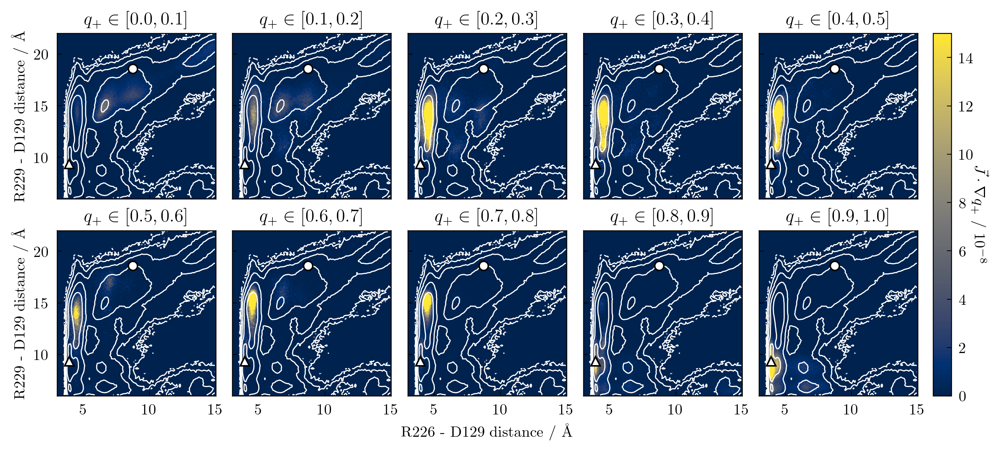

In [26]:
# PMFs in sb space

f, axs = plt.subplots(2, 5, figsize=(9, 4), dpi=300, sharex=True, sharey=True, constrained_layout=True)

xmin, xmax, ymin, ymax = 3, 15, 6, 22
xstd, ystd = (xmax - xmin) / 500, (ymax - ymin) / 500
sb0, sb1 = sb_ids[0], sb_ids[1]

# compute PMF for contours
xlim = np.linspace(xmin, xmax, 101)
ylim = np.linspace(ymin, ymax, 101)
sb0_trajs = [t[:, sb0] * 10 for t in sb_trajs]
sb1_trajs = [t[:, sb1] * 10 for t in sb_trajs]
pmf = extq.projection.density2d(sb0_trajs, sb1_trajs, weights[0], xlim, ylim)
min_energy = np.min(-np.log(pmf[np.nonzero(pmf)]))
diff = -np.log(pmf) - min_energy
centerx = (xlim[1:] + xlim[:-1]) / 2
centery = (ylim[1:] + ylim[:-1]) / 2
clines = np.linspace(0, 5, 6)
                                   
flux_arr = np.concatenate(j_du_q[4]).clip(min=0)
q = np.concatenate(qp_du)
for i, ax in enumerate(axs.flat):
    low_lim = i * 0.1
    hi_lim = (i + 1) * 0.1
    q_ts_inds = ((q >= low_lim) & (q <= hi_lim)).nonzero()[0]
    jq_ts = flux_arr[q_ts_inds]
    sb_ts = sb_arr[q_ts_inds] * 10
    # print(q_ts_inds.shape, jq_ts.shape)
    
    flux_hist, xe, ye = util.kdesum2d(
        sb_ts[:, sb0], sb_ts[:, sb1], jq_ts, xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax, nx=200, ny=200, xstd=xstd, ystd=ystd)
    pc = ax.pcolor(xe, ye, flux_hist.T / 1e-8, cmap='cividis', vmax=15)
    ax.contour(centerx, centery, diff.T * 0.593, levels=clines, colors='white')
    
    plotting.plot_models(ax, sb_models[:, [sb0, sb1]] * 10, ms=6)
    ax.set_title(f"$q_+ \\in [{low_lim:0.1f}, {hi_lim:0.1f}]$")
    ax.set(
        xlim=[xmin, xmax], 
        ylim=[ymin, ymax])
    ax.label_outer()
    
axs[1, 2].set_xlabel(f"{util.sb_label(sb0)} distance / Å")
axs[0, 0].set_ylabel(f"{util.sb_label(sb1)} distance / Å")
axs[1, 0].set_ylabel(f"{util.sb_label(sb1)} distance / Å")
cb = plt.colorbar(pc, ax=axs[:, -1])
cb.set_label("$\\vec{J} \cdot \\nabla q_+$ / $10^{-8}$", rotation=-90, labelpad=10)

/scratch/local/jobs/293176/ipykernel_1039575/2998463576.py:16: RuntimeWarning: divide by zero encountered in log
  diff = -np.log(pmf) - min_energy


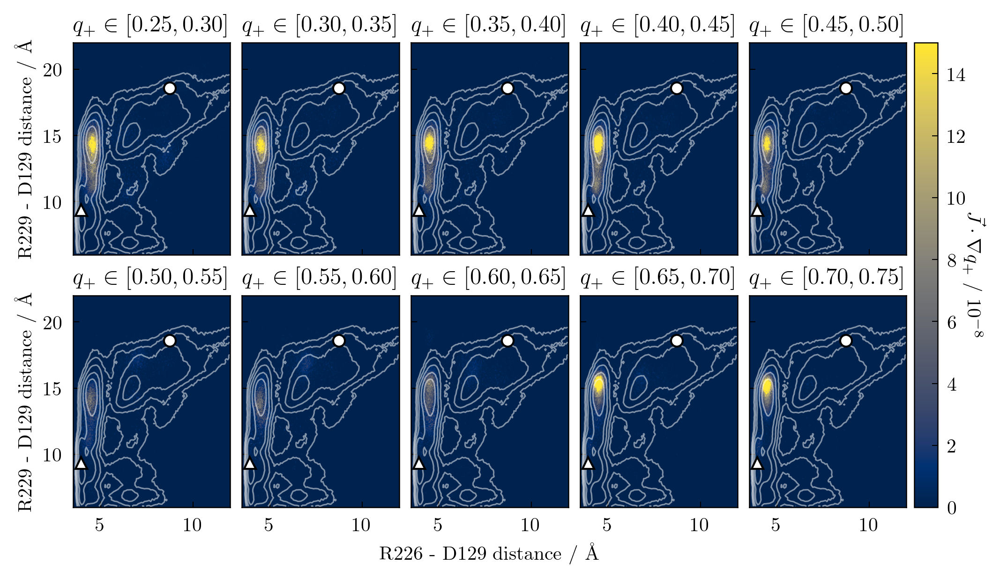

In [28]:
# PMFs in sb space

f, axs = plt.subplots(2, 5, figsize=(7, 4), dpi=300, sharex=True, sharey=True, constrained_layout=True)

xmin, xmax, ymin, ymax = 3.5, 12, 6, 22
xstd, ystd = (xmax - xmin) / 500, (ymax - ymin) / 500
sb0, sb1 = sb_ids[0], sb_ids[1]

# compute PMF for contours
xlim = np.linspace(xmin, xmax, 101)
ylim = np.linspace(ymin, ymax, 101)
sb0_trajs = [t[:, sb0] * 10 for t in sb_trajs]
sb1_trajs = [t[:, sb1] * 10 for t in sb_trajs]
pmf = extq.projection.density2d(sb0_trajs, sb1_trajs, weights[0], xlim, ylim)
min_energy = np.min(-np.log(pmf[np.nonzero(pmf)]))
diff = -np.log(pmf) - min_energy
centerx = (xlim[1:] + xlim[:-1]) / 2
centery = (ylim[1:] + ylim[:-1]) / 2
clines = np.linspace(0, 5, 6)
                                   
flux_arr = np.concatenate(j_du_q[4]).clip(min=0)
q = np.concatenate(qp_du)
for i, ax in enumerate(axs.flat):
    low_lim = i * 0.05 + 0.25
    hi_lim = (i + 1) * 0.05 + 0.25
    q_ts_inds = ((q >= low_lim) & (q <= hi_lim)).nonzero()[0]
    jq_ts = flux_arr[q_ts_inds]
    sb_ts = sb_arr[q_ts_inds] * 10
    # print(q_ts_inds.shape, jq_ts.shape)
    
    flux_hist, xe, ye = util.kdesum2d(
        sb_ts[:, sb0], sb_ts[:, sb1], jq_ts, xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax, nx=200, ny=200, xstd=xstd, ystd=ystd)
    pc = ax.pcolor(xe, ye, flux_hist.T / 1e-8, cmap='cividis', vmax=15)
    ax.contour(centerx, centery, diff.T, levels=clines, colors='white', alpha=0.5)
    
    plotting.plot_models(ax, sb_models[:, [sb0, sb1]] * 10, ms=6)
    ax.set_title(f"$q_+ \\in [{low_lim:0.2f}, {hi_lim:0.2f}]$")
    ax.set(
        xlim=[xmin, xmax], 
        ylim=[ymin, ymax])
    ax.label_outer()
    
axs[1, 2].set_xlabel(f"{util.sb_label(sb0)} distance / Å")
axs[0, 0].set_ylabel(f"{util.sb_label(sb1)} distance / Å")
axs[1, 0].set_ylabel(f"{util.sb_label(sb1)} distance / Å")
cb = plt.colorbar(pc, ax=axs[:, -1])
cb.set_label("$\\vec{J} \cdot \\nabla q_+$ / $10^{-8}$", rotation=-90, labelpad=10)

/scratch/local/jobs/293176/ipykernel_1039575/4107248183.py:15: RuntimeWarning: divide by zero encountered in log
  diff = -np.log(pmf) - min_energy


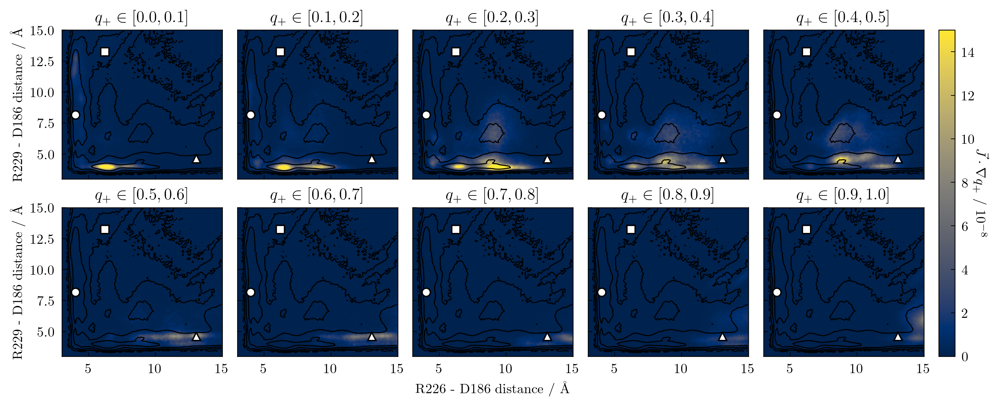

In [30]:
# PMFs in sb space

f, axs = plt.subplots(2, 5, figsize=(10, 4), dpi=300, sharex=True, sharey=True, constrained_layout=True)

xmin, xmax, ymin, ymax = 3, 15, 3, 15
sb0, sb1 = sb_ids[2], sb_ids[3]

# compute PMF for contours
xlim = np.linspace(xmin, xmax, 101)
ylim = np.linspace(ymin, ymax, 101)
sb0_trajs = [t[:, sb0] * 10 for t in sb_trajs]
sb1_trajs = [t[:, sb1] * 10 for t in sb_trajs]
pmf = extq.projection.density2d(sb0_trajs, sb1_trajs, weights[0], xlim, ylim)
min_energy = np.min(-np.log(pmf[np.nonzero(pmf)]))
diff = -np.log(pmf) - min_energy
centerx = (xlim[1:] + xlim[:-1]) / 2
centery = (ylim[1:] + ylim[:-1]) / 2
clines = np.linspace(0, 5, 6)
                                   
flux_arr = np.concatenate(j_du_q[4]).clip(min=0)
q = np.concatenate(qp_du)
for i, ax in enumerate(axs.flat):
    low_lim = i * 0.1
    hi_lim = (i + 1) * 0.1
    q_ts_inds = ((q >= low_lim) & (q <= hi_lim)).nonzero()[0]
    jq_ts = flux_arr[q_ts_inds]
    sb_ts = sb_arr[q_ts_inds] * 10
    # print(q_ts_inds.shape, jq_ts.shape)
    
    flux_hist, xe, ye = util.kdesum2d(
        sb_ts[:, sb0], sb_ts[:, sb1], jq_ts, xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax, nx=200, ny=200)
    pc = ax.pcolor(xe, ye, flux_hist.T / 1e-8, cmap='cividis', vmax=15)
    ax.contour(centerx, centery, diff.T * 0.593, levels=clines, colors='black')
    
    plotting.plot_models(ax, sb_models[:, [sb0, sb1]] * 10, ms=6)
    ax.set_title(f"$q_+ \\in [{low_lim:0.1f}, {hi_lim:0.1f}]$")
    ax.set(
        xlim=[xmin, xmax], 
        ylim=[ymin, ymax])
    ax.label_outer()
    
axs[1, 2].set_xlabel(f"{util.sb_label(sb0)} distance / Å")
axs[0, 0].set_ylabel(f"{util.sb_label(sb1)} distance / Å")
axs[1, 0].set_ylabel(f"{util.sb_label(sb1)} distance / Å")
cb = plt.colorbar(pc, ax=axs[:, -1])
cb.set_label("$\\vec{J} \cdot \\nabla q_+$ / $10^{-8}$", rotation=-90, labelpad=10)

/scratch/local/jobs/293176/ipykernel_1039575/1736649352.py:16: RuntimeWarning: divide by zero encountered in log
  diff = -np.log(pmf) - min_energy


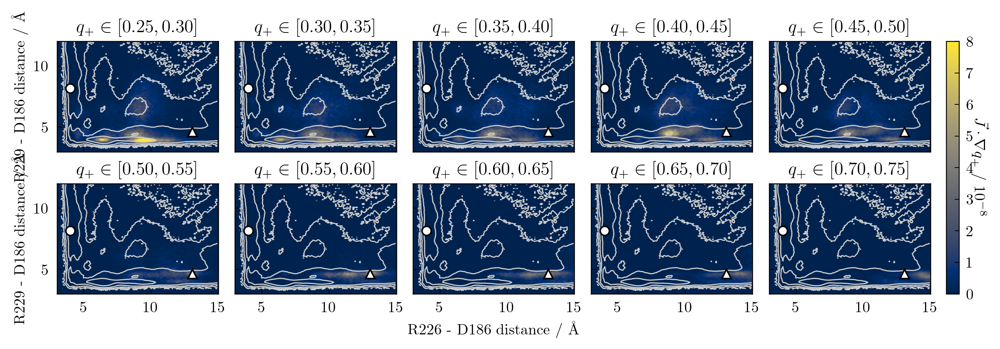

In [34]:
# PMFs in sb space

f, axs = plt.subplots(2, 5, figsize=(9, 3), dpi=300, sharex=True, sharey=True, constrained_layout=True)

xmin, xmax, ymin, ymax = 3, 15, 3, 12
xstd, ystd = (xmax - xmin) / 500, (ymax - ymin) / 500
sb0, sb1 = sb_ids[2], sb_ids[3]

# compute PMF for contours
xlim = np.linspace(xmin, xmax, 101)
ylim = np.linspace(ymin, ymax, 101)
sb0_trajs = [t[:, sb0] * 10 for t in sb_trajs]
sb1_trajs = [t[:, sb1] * 10 for t in sb_trajs]
pmf = extq.projection.density2d(sb0_trajs, sb1_trajs, weights[0], xlim, ylim)
min_energy = np.min(-np.log(pmf[np.nonzero(pmf)]))
diff = -np.log(pmf) - min_energy
centerx = (xlim[1:] + xlim[:-1]) / 2
centery = (ylim[1:] + ylim[:-1]) / 2
clines = np.linspace(0, 5, 6)
                                   
flux_arr = np.concatenate(j_du_q[4]).clip(min=0)
q = np.concatenate(qp_du)
for i, ax in enumerate(axs.flat):
    low_lim = i * 0.05 + 0.25
    hi_lim = (i + 1) * 0.05 + 0.25
    q_ts_inds = ((q >= low_lim) & (q <= hi_lim)).nonzero()[0]
    jq_ts = flux_arr[q_ts_inds]
    sb_ts = sb_arr[q_ts_inds] * 10
    # print(q_ts_inds.shape, jq_ts.shape)
    
    flux_hist, xe, ye = util.kdesum2d(
        sb_ts[:, sb0], sb_ts[:, sb1], jq_ts, xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax, nx=200, ny=200)
    pc = ax.pcolor(xe, ye, flux_hist.T / 1e-8, cmap='cividis', vmax=8)
    ax.contour(centerx, centery, diff.T * 0.593, levels=clines, colors='0.8')
    
    plotting.plot_models(ax, sb_models[:, [sb0, sb1]] * 10, ms=6)
    ax.set_title(f"$q_+ \\in [{low_lim:0.2f}, {hi_lim:0.2f}]$")
    ax.set(
        xlim=[xmin, xmax], 
        ylim=[ymin, ymax])
    ax.label_outer()
    
axs[1, 2].set_xlabel(f"{util.sb_label(sb0)} distance / Å")
axs[0, 0].set_ylabel(f"{util.sb_label(sb1)} distance / Å")
axs[1, 0].set_ylabel(f"{util.sb_label(sb1)} distance / Å")
cb = plt.colorbar(pc, ax=axs[:, -1])
cb.set_label("$\\vec{J} \cdot \\nabla q_+$ / $10^{-8}$", rotation=-90, labelpad=10)

/scratch/local/jobs/293176/ipykernel_1039575/3880356082.py:13: RuntimeWarning: divide by zero encountered in log
  diff = -np.log(pmf) - min_energy


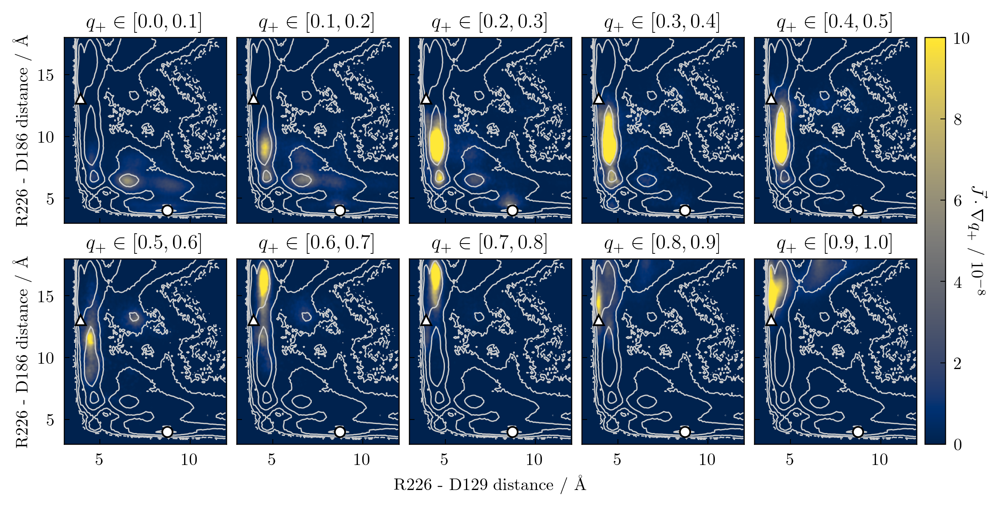

In [35]:
f, axs = plt.subplots(2, 5, figsize=(8, 4), dpi=300, sharex=True, sharey=True, constrained_layout=True)

xmin, xmax, ymin, ymax = 3, 12, 3, 18
sb0, sb1 = sb_ids[0], sb_ids[2]

# compute PMF for contours
xlim = np.linspace(xmin, xmax, 101)
ylim = np.linspace(ymin, ymax, 101)
sb0_trajs = [t[:, sb0] * 10 for t in sb_trajs]
sb1_trajs = [t[:, sb1] * 10 for t in sb_trajs]
pmf = extq.projection.density2d(sb0_trajs, sb1_trajs, weights[0], xlim, ylim)
min_energy = np.min(-np.log(pmf[np.nonzero(pmf)]))
diff = -np.log(pmf) - min_energy
centerx = (xlim[1:] + xlim[:-1]) / 2
centery = (ylim[1:] + ylim[:-1]) / 2
clines = np.linspace(0, 5, 6)
                                   
flux_arr = np.concatenate(j_du_q[4]).clip(min=0)
q = np.concatenate(qp_du)
for i, ax in enumerate(axs.flat):
    low_lim = i * 0.1
    hi_lim = (i + 1) * 0.1
    q_ts_inds = ((q >= low_lim) & (q <= hi_lim)).nonzero()[0]
    jq_ts = flux_arr[q_ts_inds]
    sb_ts = sb_arr[q_ts_inds] * 10
    # print(q_ts_inds.shape, jq_ts.shape)
    
    flux_hist, xe, ye = util.kdesum2d(
        sb_ts[:, sb0], sb_ts[:, sb1], jq_ts, xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax, nx=200, ny=200)
    pc = ax.pcolor(xe, ye, flux_hist.T / 1e-8, cmap='cividis', vmax=10)
    ax.contour(centerx, centery, diff.T * 0.593, levels=clines, colors='0.8')
    
    plotting.plot_models(ax, sb_models[:, [sb0, sb1]] * 10, ms=6)
    ax.set_title(f"$q_+ \\in [{low_lim:0.1f}, {hi_lim:0.1f}]$")
    ax.set(
        xlim=[xmin, xmax], 
        ylim=[ymin, ymax])
    ax.label_outer()
    
axs[1, 2].set_xlabel(f"{util.sb_label(sb0)} distance / Å")
axs[0, 0].set_ylabel(f"{util.sb_label(sb1)} distance / Å")
axs[1, 0].set_ylabel(f"{util.sb_label(sb1)} distance / Å")
cb = plt.colorbar(pc, ax=axs[:, -1])
cb.set_label("$\\vec{J} \cdot \\nabla q_+$ / $10^{-8}$", rotation=-90, labelpad=10)

/scratch/local/jobs/293176/ipykernel_1039575/3270744166.py:13: RuntimeWarning: divide by zero encountered in log
  diff = -np.log(pmf) - min_energy


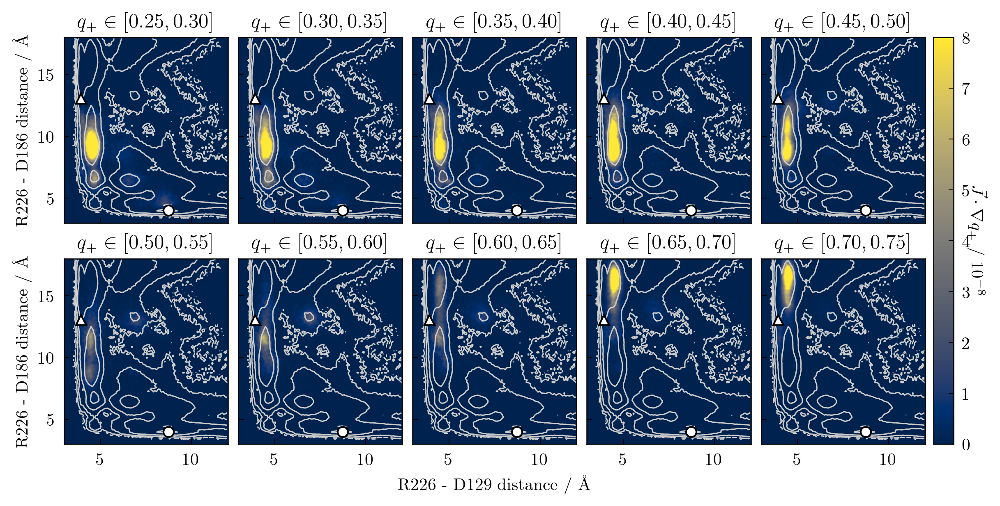

In [37]:
f, axs = plt.subplots(2, 5, figsize=(8, 4), dpi=300, sharex=True, sharey=True, constrained_layout=True)

xmin, xmax, ymin, ymax = 3, 12, 3, 18
sb0, sb1 = sb_ids[0], sb_ids[2]

# compute PMF for contours
xlim = np.linspace(xmin, xmax, 101)
ylim = np.linspace(ymin, ymax, 101)
sb0_trajs = [t[:, sb0] * 10 for t in sb_trajs]
sb1_trajs = [t[:, sb1] * 10 for t in sb_trajs]
pmf = extq.projection.density2d(sb0_trajs, sb1_trajs, weights[0], xlim, ylim)
min_energy = np.min(-np.log(pmf[np.nonzero(pmf)]))
diff = -np.log(pmf) - min_energy
centerx = (xlim[1:] + xlim[:-1]) / 2
centery = (ylim[1:] + ylim[:-1]) / 2
clines = np.linspace(0, 5, 6)
                                   
flux_arr = np.concatenate(j_du_q[4]).clip(min=0)
q = np.concatenate(qp_du)
for i, ax in enumerate(axs.flat):
    low_lim = i * 0.05 + 0.25
    hi_lim = (i + 1) * 0.05 + 0.25
    q_ts_inds = ((q >= low_lim) & (q <= hi_lim)).nonzero()[0]
    jq_ts = flux_arr[q_ts_inds]
    sb_ts = sb_arr[q_ts_inds] * 10
    # print(q_ts_inds.shape, jq_ts.shape)
    
    flux_hist, xe, ye = util.kdesum2d(
        sb_ts[:, sb0], sb_ts[:, sb1], jq_ts, xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax, nx=200, ny=200)
    pc = ax.pcolor(xe, ye, flux_hist.T / 1e-8, cmap='cividis', vmax=8)
    ax.contour(centerx, centery, diff.T * 0.593, levels=clines, colors='0.8')
    
    plotting.plot_models(ax, sb_models[:, [sb0, sb1]] * 10, ms=6)
    ax.set_title(f"$q_+ \\in [{low_lim:0.2f}, {hi_lim:0.2f}]$")
    ax.set(
        xlim=[xmin, xmax], 
        ylim=[ymin, ymax])
    ax.label_outer()
    
axs[1, 2].set_xlabel(f"{util.sb_label(sb0)} distance / Å")
axs[0, 0].set_ylabel(f"{util.sb_label(sb1)} distance / Å")
axs[1, 0].set_ylabel(f"{util.sb_label(sb1)} distance / Å")
cb = plt.colorbar(pc, ax=axs[:, -1])
cb.set_label("$\\vec{J} \cdot \\nabla q_+$ / $10^{-8}$", rotation=-90, labelpad=10)

/scratch/local/jobs/3781773/ipykernel_2290473/781435024.py:12: RuntimeWarning: divide by zero encountered in log
  diff = -np.log(pmf) - min_energy


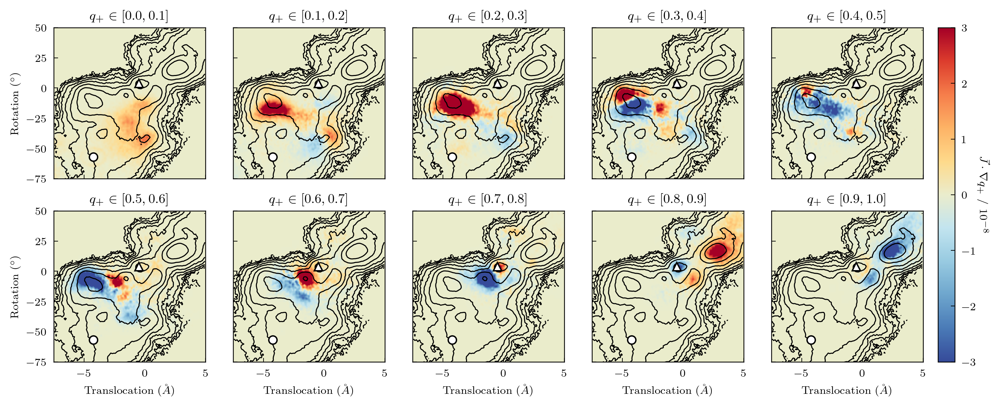

In [59]:
f, axs = plt.subplots(2, 5, figsize=(10, 4), dpi=300, sharex=True, sharey=True, constrained_layout=True)

xmin, xmax, ymin, ymax = -7.5, 5, -100, 50

# compute PMF for contours
xlim = np.linspace(xmin, xmax, 101)
ylim = np.linspace(ymin, ymax, 101)
dist_trajs = [t[:, 0] for t in cv_trajs]
rot_trajs = [t[:, 1] for t in cv_trajs]
pmf = extq.projection.density2d(dist_trajs, rot_trajs, weights[0], xlim, ylim)
min_energy = np.min(-np.log(pmf[np.nonzero(pmf)]))
diff = -np.log(pmf) - min_energy
centerx = (xlim[1:] + xlim[:-1]) / 2
centery = (ylim[1:] + ylim[:-1]) / 2
clines = np.linspace(0, 10, 11)

flux_arr = np.concatenate(j_du_q[4])
q = np.concatenate(qp_du[8])
for i, ax in enumerate(axs.flat):
    low_lim = i * 0.1
    hi_lim = (i + 1) * 0.1
    q_ts_inds = ((q >= low_lim) & (q <= hi_lim)).nonzero()[0]
    jq_ts = flux_arr[q_ts_inds]
    cv_ts = cv_arr[q_ts_inds]
    # print(q_ts_inds.shape, jq_ts.shape)
    
    flux_hist, xe, ye = util.kdesum2d(
        cv_ts[:, 0], cv_ts[:, 1], jq_ts, xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax, nx=200, ny=200)
    pc = ax.pcolor(xe, ye, flux_hist.T / 1e-8, cmap=cm_div, vmin=-3, vmax=3)
    ax.contour(centerx, centery, diff.T, levels=clines, colors='black')
    
    plotting.format_cvs(ax, ms=6)
    ax.set(xlim=[-7.5, 5], ylim=[-75, 50])
    ax.set_title(f"$q_+ \\in [{low_lim:0.1f}, {hi_lim:0.1f}]$")
    ax.label_outer()
    
cb = plt.colorbar(pc, ax=axs[:, -1])
cb.set_label("$\\vec{J} \cdot \\nabla q_+$ / $10^{-8}$", rotation=-90, labelpad=10)

/scratch/local/jobs/293176/ipykernel_1039575/3962509141.py:13: RuntimeWarning: divide by zero encountered in log
  diff = -np.log(pmf) - min_energy


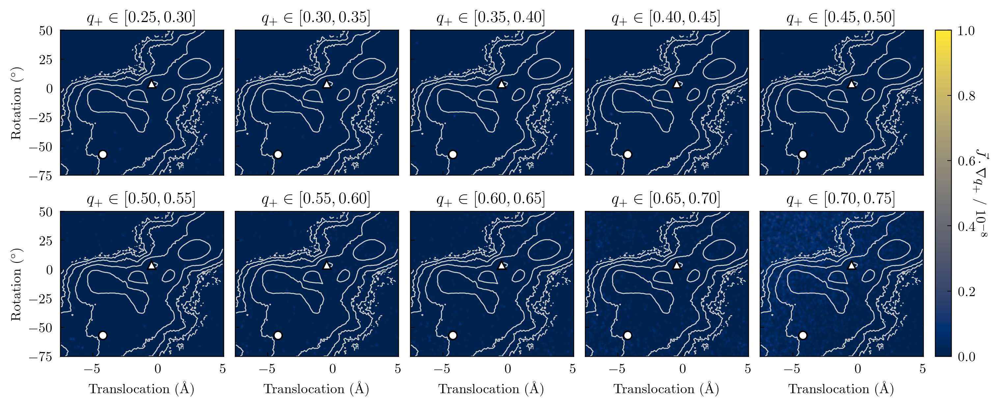

In [41]:
f, axs = plt.subplots(2, 5, figsize=(10, 4), dpi=300, sharex=True, sharey=True, constrained_layout=True)

xmin, xmax, ymin, ymax = -7.5, 5, -100, 50
xstd, ystd = (xmax - xmin) / 500, (ymax - ymin) / 500

# compute PMF for contours
xlim = np.linspace(xmin, xmax, 101)
ylim = np.linspace(ymin, ymax, 101)
dist_trajs = [t[:, 0] for t in cv_trajs]
rot_trajs = [t[:, 1] for t in cv_trajs]
pmf = extq.projection.density2d(dist_trajs, rot_trajs, weights[0], xlim, ylim)
min_energy = np.min(-np.log(pmf[np.nonzero(pmf)]))
diff = -np.log(pmf) - min_energy
centerx = (xlim[1:] + xlim[:-1]) / 2
centery = (ylim[1:] + ylim[:-1]) / 2
clines = np.linspace(0, 5, 6)
                                   
flux_arr = np.concatenate(j_du_q[4]).clip(min=0)
q = np.concatenate(qp_du)
for i, ax in enumerate(axs.flat):
    low_lim = i * 0.05 + 0.25
    hi_lim = (i + 1) * 0.05 + 0.25
    q_ts_inds = ((q >= low_lim) & (q <= hi_lim)).nonzero()[0]
    jq_ts = flux_arr[q_ts_inds]
    cv_ts = cv_arr[q_ts_inds] * 10
    # print(q_ts_inds.shape, jq_ts.shape)
    
    flux_hist, xe, ye = util.kdesum2d(
        cv_ts[:, 0], cv_ts[:, 1], jq_ts, xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax, nx=200, ny=200)
    pc = ax.pcolor(xe, ye, flux_hist.T / 1e-8, cmap='cividis', vmax=1)
    ax.contour(centerx, centery, diff.T * 0.593, levels=clines, colors='0.8')
    
    plotting.format_cvs(ax, ms=6)
    ax.set(xlim=[-7.5, 5], ylim=[-75, 50])
    ax.set_title(f"$q_+ \\in [{low_lim:0.2f}, {hi_lim:0.2f}]$")
    ax.label_outer()
    
cb = plt.colorbar(pc, ax=axs[:, -1])
cb.set_label("$\\vec{J} \cdot \\nabla q_+$ / $10^{-8}$", rotation=-90, labelpad=10)